In [1]:
### Definining name of analysis ###
name = '2023-06-02_LinusAccelerations_Flight2'
data_path = '../../data/'
data_folder = 'linus-2023-06-02'
file_name = '00000017.BIN'
datasave_path = data_path+data_folder+'/'
result_path = '../Results/'+name+'/'
figure_path = '../Figures/'+name+'/'

In [2]:
from os import sys
import os
sys.path.append('../../')

# Getting packages #
%matplotlib widget

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from scipy import optimize 
from scipy.io import savemat
import pandas as pd

import plotly.express as px

import main
from main import flight
from main import analysis
import propellers
import motors
from aircraft import airplane
import cl_finders

import data_exporter
import datetime

### Creating Folders for Results/Data ###
if not os.path.exists(result_path):
    os.makedirs(result_path)
if not os.path.exists(figure_path):
    os.makedirs(figure_path)

In [3]:
# Setting Plot Defaults
plt.style.use('../../basic_plotter.mplstyle')

In [4]:
# Importing data, specifying import characteristics, backing up results
rate = "10ms"
interpolateM = "linear"
processor = "ArduPlane_4_3_3"

rawdata_name = data_folder+'/'+file_name.split('.')[0]+'_'+rate+'_'+interpolateM+'_'+processor+'.pkl'

# Checking if the data is already pickled for analysis
if os.path.exists(data_path+rawdata_name):
    df = pd.read_pickle(data_path+rawdata_name)
else:
    df = main.get_data(processor, data_folder+'/'+file_name, rate)
    df = df.interpolate(method=interpolateM)
    pd.to_pickle(df, data_path+rawdata_name) # Storing parsed data

In [5]:
# Vehicle parameters
prop = propellers.aeronaut11x7_estimatedBEN() # Using aeronaut 20x8 for this flight
motor = motors.U7V2_280KV()  # Using U7 V2 motor

mass = 1.820 # Estimated with virtual bolt included
span = 2.54
chord = 0.149
linus = airplane(mass, chord, span)

P_systems = 0.3 # Amount of power consumed by everything except the ESC & motor

highorderpolar = True

# Need to Do for Power Estimate
1. Rotate the accelerations into the body frame (Find $\dot{U}$)
2. Estimate the propeller thrust $T$
3. Establish the variance of the measurement
4. Bin the results by airspeed!

$ P_{req} = T V_T - mg\dot{h} - m \dot{U} V_T $

# Generating Plots (Acceleration Visualization)

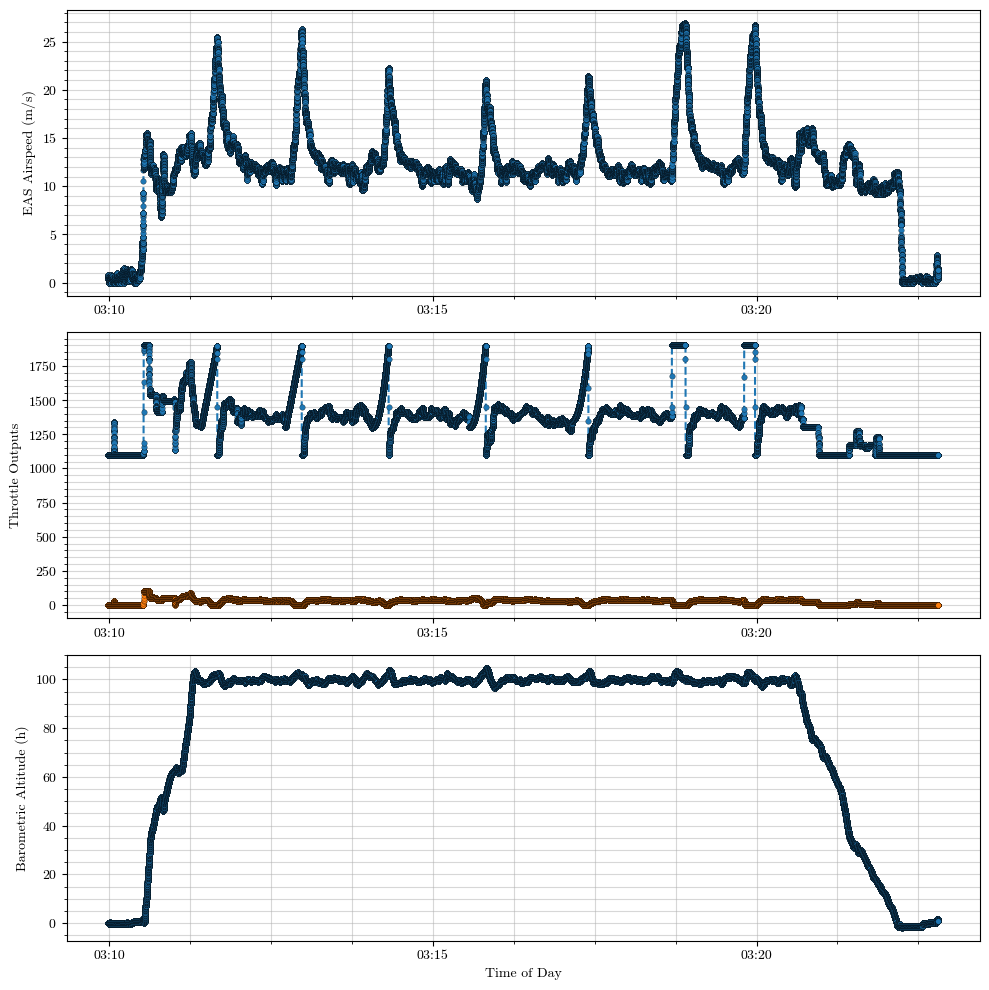

Plot already exists


In [6]:
# Generating Plots
timeindex_v_thr_h = plt.figure(figsize=(10,10))

ax0 = plt.subplot(3,1,1)
plt.grid("On")
plt.plot(df.index, df.Airspeed_Sensor0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.ylabel("EAS Airspeed (m/s)")
ax1 = plt.subplot(3,1,2, sharex=ax0)
plt.grid("On")
plt.plot(df.index, df.ThrottleOut, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.plot(df.index, df.Throttle, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.ylabel("Throttle Outputs")
ax2 = plt.subplot(3,1,3, sharex=ax0)
plt.grid("On")
plt.plot(df.index, df.Altitude_BARO_0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.ylabel("Barometric Altitude (h)")
plt.xlabel("Time of Day")
plt.grid("On")
plt.show()

main.save_figure(timeindex_v_thr_h, f'{timeindex_v_thr_h=}'.split('=')[0], figure_path)

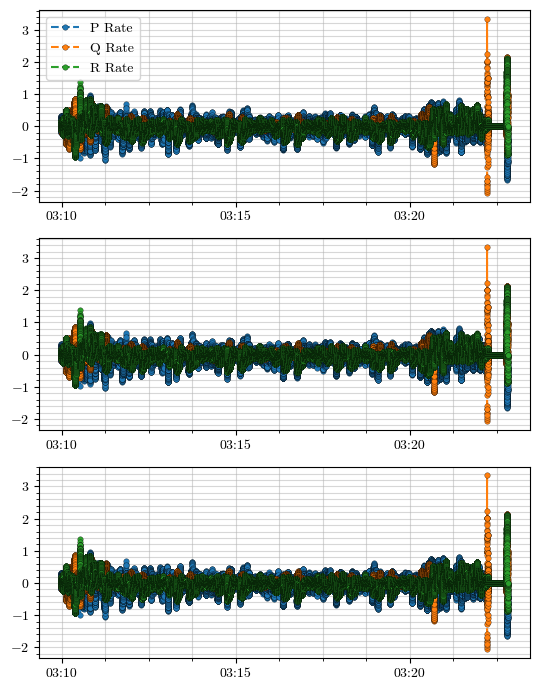

Plot already exists


In [7]:
# Plotting the Rotational Rates
rotationalrates = plt.figure(figsize=(5.5,7))

ax0 = plt.subplot(3,1,1)
ax0.plot(df.index, df.GyroX_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0], label="P Rate")
ax0.plot(df.index, df.GyroY_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0], label="Q Rate")
ax0.plot(df.index, df.GyroZ_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0], label="R Rate")
ax0.legend()

ax1 = plt.subplot(3,1,2, sharex=ax0, sharey=ax0)
ax1.plot(df.index, df.GyroX_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax1.plot(df.index, df.GyroY_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax1.plot(df.index, df.GyroZ_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])

ax2 = plt.subplot(3,1,3, sharex=ax0, sharey=ax0)
ax2.plot(df.index, df.GyroX_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax2.plot(df.index, df.GyroY_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax2.plot(df.index, df.GyroZ_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.show()

main.save_figure(rotationalrates, f'{rotationalrates=}'.split('=')[0], figure_path)

In [8]:
## Generating Map Plots Descending ## 
token = "pk.eyJ1Ijoid2tlbXA5NCIsImEiOiJjbGI0NHJuemkwMmF2M29zM24xcTlpNXVjIn0.qSiAc29MftNSOK2DOpRggw"
color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name=df.index, 
                        #hover_data=["Address", "Listed"],
                        color="Airspeed_Sensor0",
                        color_continuous_scale='jet',
                        #size="Listed",
                        zoom=15.5, 
                        height=600,
                        width=900,
                        labels={"Airspeed_Sensor0": 'Airspeed (m/s)'},
                        template='presentation')
fig.update_layout(mapbox_style="satellite", mapbox_accesstoken=token)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

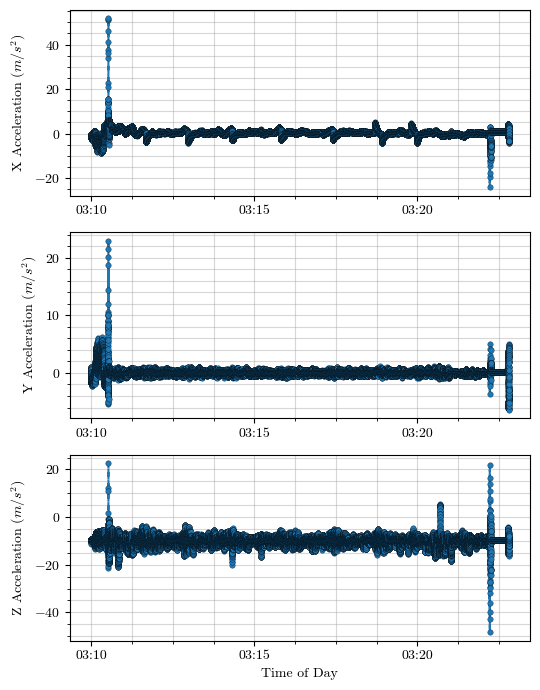

In [9]:
# Plotting raw IMU accelerations
raw_IMU0_accelerations = plt.figure(figsize=(5.5,7))
ax0 = plt.subplot(3,1,1)
plt.plot(df.index, df.XAcc_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.ylabel("X Acceleration $(m/s^2)$")
ax1 = plt.subplot(3,1,2, sharex=ax0)
plt.plot(df.index, df.YAcc_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.ylabel("Y Acceleration $(m/s^2)$")
ax2 = plt.subplot(3,1,3, sharex=ax0)
plt.plot(df.index, df.ZAcc_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.xlabel("Time of Day")
plt.ylabel("Z Acceleration $(m/s^2)$")
plt.show()

# main.save_figure(raw_IMU0_accelerations, f'{raw_IMU0_accelerations=}'.split('=')[0], figure_path)

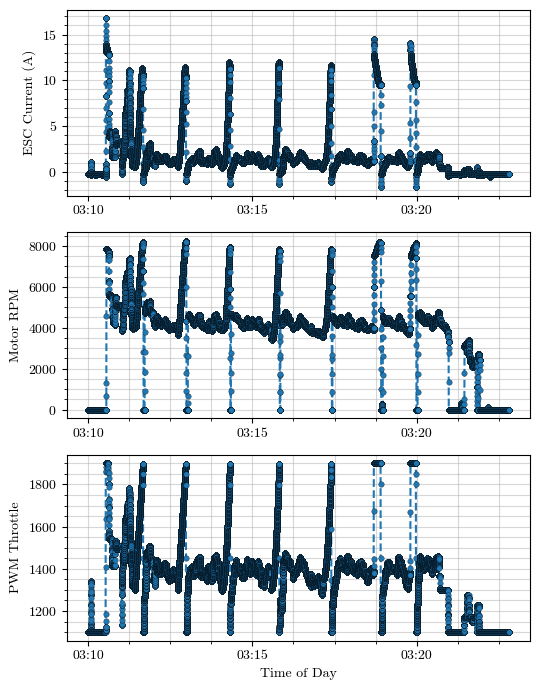

Plot already exists


In [10]:
# Plotting Propulsion Information
timeindex_I_RPM_thr = plt.figure(figsize=(5.5,7))

ax0 = plt.subplot(3,1,1)
ax0.plot(df.index, df.MainBatteryCurrent, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax0.set_ylabel("ESC Current (A)")
ax1 = plt.subplot(3,1,2, sharex=ax0)
ax1.plot(df.index, df.MotorRPM, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax1.set_ylabel("Motor RPM")
ax2 = plt.subplot(3,1,3, sharex=ax0)
ax2.plot(df.index, df.ThrottleOut, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax2.set_ylabel("PWM Throttle")
ax2.set_xlabel("Time of Day")
plt.show()

main.save_figure(timeindex_I_RPM_thr, f'{timeindex_I_RPM_thr=}'.split('=')[0], figure_path)

In [11]:
### Mask Initialization ###

# Generating Start/End Times for Segments #
# Producing masks for dataframe

# def get_mask(df, start, end, year, month, day):
#     # Getting boolean mask from start and end times
#     start_time = get_datetime(start, year, month, day)
#     end_time = get_datetime(end, year, month, day)
#     mask = (df.index > start_time) & (df.index < end_time)
#     return mask

# def get_datetime(hour_string, year, month, day):
#     # Results completed datetime from hour string, and date
#     split_nums = hour_string.split(':')
#     hours = int(split_nums[0])
#     minutes = int(split_nums[1])
#     seconds = int(split_nums[2])
#     return pd.Timestamp(year=year, month=month, day=day, hour=hours, minute=minutes, second=seconds)

year = 2023
month = 6
day = 3

# Acceleration Masking from the above figures
seg_times = np.array([['03:11:25','03:11:40'],
                      ['03:12:44','03:12:58'],
                      ['03:14:03','03:14:18'],
                      ['03:15:34','03:15:48'],
                      ['03:17:09','03:17:24'],
                      ['03:18:42','03:18:54'],
                      ['03:19:49', '03:19:58']])
seg_zeroing = np.array([['03:22:15', '03:22:45']])
mask_array = []
acc_masks = []
for i in range(np.shape(seg_times)[0]):
    mask = cl_finders.get_mask(df, seg_times[i,0], seg_times[i,1], year, month, day)
    mask_array.append(mask)
for i in range(np.shape(seg_zeroing)[0]):
    mask = cl_finders.get_mask(df, seg_zeroing[i,0], seg_zeroing[i,1], year, month, day)
    acc_masks.append(mask)

In [12]:
############# Main Analysis ###############3

# Gravity
g = 9.807

# Attitude 
phi = np.deg2rad(df["RollAngle"].to_numpy())            # Bank angle in radians
theta = np.deg2rad(df["PitchAngle"].to_numpy())         # Pitch angle in radians

# Atmospheric adjustments:
rho = df["Pressure_BARO0"].to_numpy() * (287 * (df["Temperature_ARSP"].to_numpy()+273.15))**-1             # Density found from barometer pressure & airspeed sensor temperatures
v_eas = df["Airspeed_Sensor0"].to_numpy()                               # Equivalent SSL airspeed (m/s)
v_tas = v_eas * np.sqrt(1.225) * np.sqrt(rho)**-1   # the true airspeed
q = 0.5 * rho * v_tas**2                            # Dynamic pressure 

# For Descent method
h = df["Altitude_POS"].to_numpy()                   # Altitude
Vd_eas = df["DescentRate"].to_numpy()                  # Descent Rate from EKF (is it true or EAS at SSL?)
Vd_tas = Vd_eas * np.sqrt(1.225) * np.sqrt(rho)**-1   # the true airspeed

gamma = np.arcsin(-Vd_tas/v_tas)
alpha = gamma + theta

# Propulsion characterization
n = df["MotorRPM"].to_numpy() / 60                               # Revolutions per second
i_esc = df["MainBatteryCurrent"].to_numpy()                      # Really the ESC voltage and current here
v_esc = df["MainBatteryVoltage"].to_numpy()
J = v_tas / (n * prop.diameter)
eff = prop.efficiency(J) * motor.efficiency(n, i_esc)

# Inertial Measurement Unit
xp_acc = df["XAcc_IMU0"].to_numpy()                       # Acceleration in X direction of the IMU
yp_acc = df.YAcc_IMU0.to_numpy()                       # Acceleration in Y direction of the IMU
zp_acc = df["ZAcc_IMU0"].to_numpy()                       # Acceleration in Z direction of the IMU

U_dot = xp_acc - g * np.sin(theta)
V_dot = yp_acc + (g * np.cos(theta) * np.sin(phi))
W_dot = zp_acc + g * np.cos(theta) * np.cos(phi)

gamma = np.arcsin(-Vd_tas/v_tas)
alpha = theta - gamma #gamma + theta

U = v_tas * np.cos(alpha)
V = 0
W = v_tas * np.sin(alpha)

P = df.GyroX_IMU0 
Q = df.GyroY_IMU0
R = df.GyroZ_IMU0

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_11250/3376936.py:11: RuntimeWarning:

invalid value encountered in reciprocal

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_11250/3376936.py:13: RuntimeWarning:

invalid value encountered in reciprocal

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_11250/3376936.py:19: RuntimeWarning:

invalid value encountered in reciprocal

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_11250/3376936.py:21: RuntimeWarning:

divide by zero encountered in true_divide

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_11250/3376936.py:21: RuntimeWarning:

invalid value encountered in arcsin

/Users/williamkemp/Records/Repositories/CREATeV_AnalysisSuite/Investigations/20_Performance_Investigations/../../motors.py:53: RuntimeWarning:

invalid value encountered in reciprocal

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_11250/3376936.py:40: RuntimeWarning:

divide by zero encountered in 

9.794180315517817
0.003986259992648439


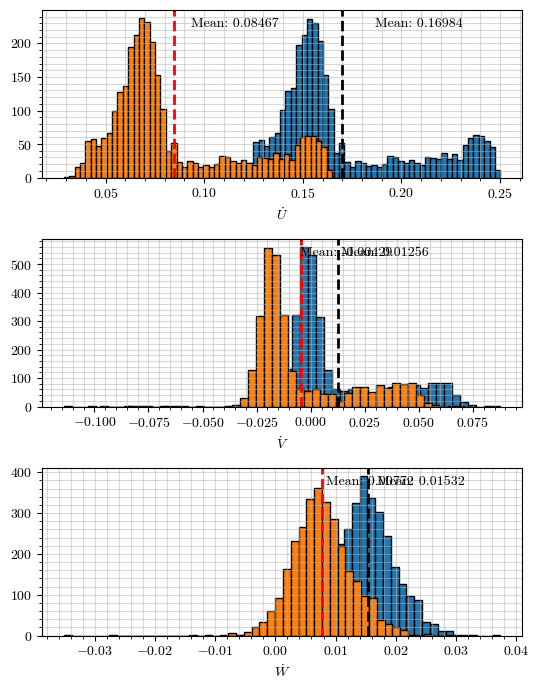

In [99]:
thetap = -0.5 * (np.pi/180) # 0.4 * (np.pi/180)  # Pitch perturbation from IMU orientation (Degrees)
phip = 0.1 * (np.pi/180)  # Roll perturbation from IMU orientation (Degrees)
IMUtotal = np.sqrt(xp_acc**2 + yp_acc**2 + zp_acc**2)
print(np.mean(IMUtotal[acc_masks[0]]))
print(np.std(IMUtotal[acc_masks[0]]))

U_dot = xp_acc - np.mean(IMUtotal[acc_masks[0]]) * np.sin(theta)
V_dot = yp_acc + (np.mean(IMUtotal[acc_masks[0]]) * np.cos(theta) * np.sin(phi))
W_dot = zp_acc + np.mean(IMUtotal[acc_masks[0]]) * np.cos(theta) * np.cos(phi)

U_dotp = xp_acc - (np.mean(IMUtotal[acc_masks[0]]) * np.sin(theta+thetap))
V_dotp = yp_acc + (np.mean(IMUtotal[acc_masks[0]]) * np.cos(theta+thetap) * np.sin(phi+phip))
W_dotp = zp_acc + (np.mean(IMUtotal[acc_masks[0]]) * np.cos(theta+thetap) * np.cos(phi+phip))

def plot_hist(mask_array):

    plt.figure(figsize=(5.5, 7))
    plt.title("Body Accelerations in X Direction")
    i = 0
    ax0 = plt.subplot(3,1,1)
    ax0.hist(U_dotp[mask_array[i]], bins=50, edgecolor='k', label='Adjusted')
    ax0.hist(U_dot[mask_array[i]], bins=50, edgecolor='k', label='Original')
    ax0.axvline(np.mean(U_dotp[mask_array[i]]), color='k', linestyle='dashed', linewidth=2)
    ax0.axvline(np.mean(U_dot[mask_array[i]]), color='r', linestyle='dashed', linewidth=2)
    ax0.set_xlabel("$\dot{U}$")
    min_ylim, max_ylim = ax0.set_ylim()
    ax0.text(U_dotp[mask_array[i]].mean()*1.1, max_ylim*0.9, 'Mean: {:.5f}'.format(U_dotp[mask_array[i]].mean()))
    ax0.text(U_dot[mask_array[i]].mean()*1.1, max_ylim*0.9, 'Mean: {:.5f}'.format(U_dot[mask_array[i]].mean()))

    ax1 = plt.subplot(3,1,2)
    ax1.hist(V_dotp[mask_array[i]], bins=50, edgecolor='k', label='Adjusted')
    ax1.hist(V_dot[mask_array[i]], bins=50, edgecolor='k', label='Original')
    ax1.axvline(np.mean(V_dotp[mask_array[i]]), color='k', linestyle='dashed', linewidth=2)
    ax1.axvline(np.mean(V_dot[mask_array[i]]), color='r', linestyle='dashed', linewidth=2)
    ax1.set_xlabel("$\dot{V}$")
    min_ylim, max_ylim = ax1.set_ylim()
    ax1.text(V_dotp[mask_array[i]].mean()*1.1, max_ylim*0.9, 'Mean: {:.5f}'.format(V_dotp[mask_array[i]].mean()))
    ax1.text(V_dot[mask_array[i]].mean()*1.1, max_ylim*0.9, 'Mean: {:.5f}'.format(V_dot[mask_array[i]].mean()))

    ax2 = plt.subplot(3,1,3)
    ax2.hist(W_dotp[mask_array[i]], bins=50, edgecolor='k', label='Adjusted')
    ax2.hist(W_dot[mask_array[i]], bins=50, edgecolor='k', label='Original')
    ax2.axvline(np.mean(W_dotp[mask_array[i]]), color='k', linestyle='dashed', linewidth=2)
    ax2.axvline(np.mean(W_dot[mask_array[i]]), color='r', linestyle='dashed', linewidth=2)
    ax2.set_xlabel("$\dot{W}$")
    min_ylim, max_ylim = ax2.set_ylim()
    ax2.text(W_dotp[mask_array[i]].mean()*1.1, max_ylim*0.9, 'Mean: {:.5f}'.format(W_dotp[mask_array[i]].mean()))
    ax2.text(W_dot[mask_array[i]].mean()*1.1, max_ylim*0.9, 'Mean: {:.5f}'.format(W_dot[mask_array[i]].mean()))

    plt.show()
plot_hist(acc_masks)


In [100]:
# Beginning Power Required Calculation #
CT = prop.thrust_coeff(J)
T = CT * rho * n**2 * prop.diameter**4
P_req_t1 = (T * v_tas)
P_req_t2 = (mass * g * Vd_tas)
P_req_t3 = -(mass * U_dotp * v_tas)
P_req_t4 = -(mass * W_dotp * v_tas * alpha)

P_req_q = mass * v_tas * (Q*U*alpha - Q*W)
P_req_pr = mass * v_tas * (R*V - P*V)

P_req = P_req_t1 + P_req_t2 + P_req_t3
P_req_r1 = P_req_t1 + P_req_t2 + P_req_t3 + P_req_t4
P_req_r2 = P_req_t1 + P_req_t2 + P_req_t3 + P_req_t4 + P_req_q + P_req_pr

D = P_req / v_tas
D_r1 = P_req_r1 / v_tas
D_r2 = P_req_r2 / v_tas

L = mass * (U_dotp * alpha - W_dotp) + (mass * g) - (T * alpha)

CD = D / (0.5 * rho * v_tas**2 * linus.area) # still need to estimate the wing area of linus
CD_r1 = D_r1 / (0.5 * rho * v_tas**2 * linus.area) # still need to estimate the wing area of linus
CD_r2 = D_r2 / (0.5 * rho * v_tas**2 * linus.area) # still need to estimate the wing area of linus
CL = cl_finders.cl_usbanked(linus, q, phi, W_dot)
CL_exp = L / (0.5 * rho * v_tas**2 * linus.area)

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_11250/2027571153.py:16: RuntimeWarning:

divide by zero encountered in true_divide

/Users/williamkemp/Records/Repositories/CREATeV_AnalysisSuite/Investigations/20_Performance_Investigations/../../cl_finders.py:130: RuntimeWarning:

divide by zero encountered in reciprocal

/Users/williamkemp/Records/Repositories/CREATeV_AnalysisSuite/Investigations/20_Performance_Investigations/../../cl_finders.py:130: RuntimeWarning:

invalid value encountered in reciprocal



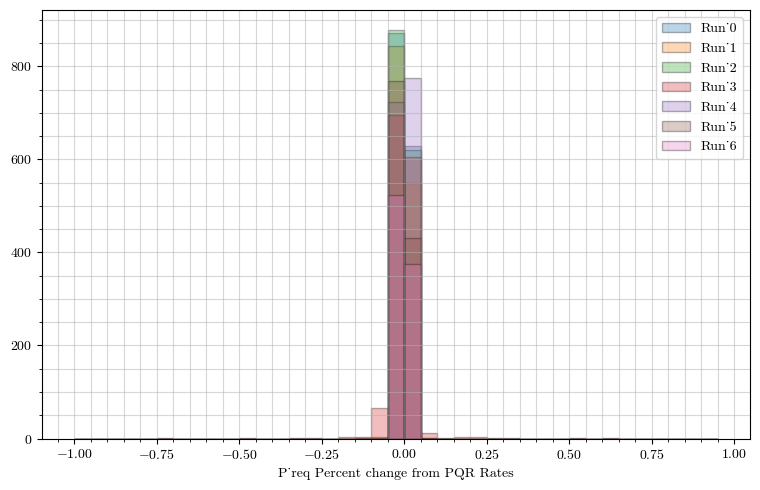

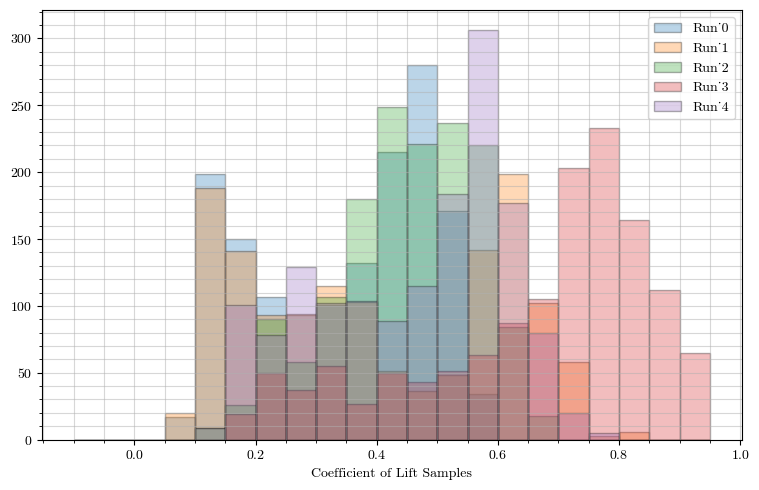

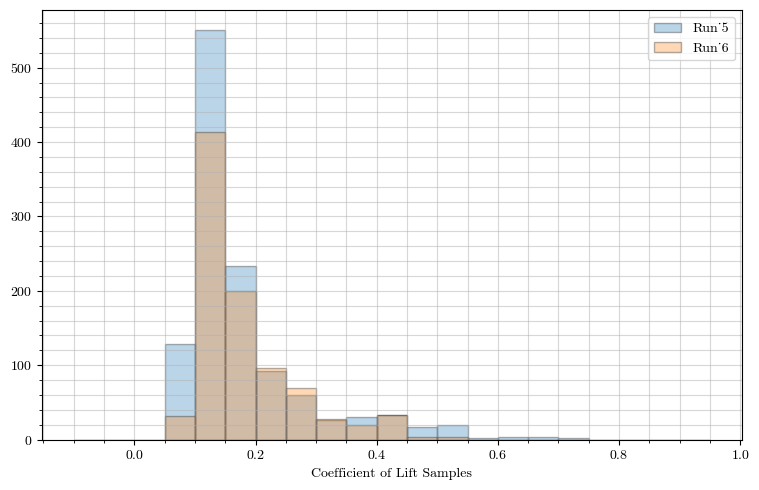

In [101]:
# Plotting the percent change from the PQR rates in the transient response
fig = plt.figure(figsize=(7.7,5))
ax = plt.subplot(1,1,1)
percent_change = 100 * (P_req_r2 - P_req_r1) / P_req_r1
for i in range(len(mask_array)):
    ax.hist(percent_change[mask_array[i]], bins=np.arange(-1, 1, 0.05), edgecolor=[0,0,0], label='Run_'+str(i), alpha=0.3)
plt.xlabel("P_req Percent change from PQR Rates")
plt.legend()
plt.show()

fig = plt.figure(figsize=(7.7,5))
ax = plt.subplot(1,1,1)
for i in [0, 1, 2, 3, 4]:
    ax.hist(CL_exp[mask_array[i]], bins=np.arange(-0.1, 1, 0.05), edgecolor=[0,0,0], label='Run_'+str(i), alpha=0.3)
plt.xlabel("Coefficient of Lift Samples")
plt.legend()
plt.show()

fig = plt.figure(figsize=(7.7,5))
ax = plt.subplot(1,1,1)
for i in [5, 6]:
    ax.hist(CL_exp[mask_array[i]], bins=np.arange(-0.1, 1, 0.05), edgecolor=[0,0,0], label='Run_'+str(i), alpha=0.3)
plt.xlabel("Coefficient of Lift Samples")
plt.legend()
plt.show()

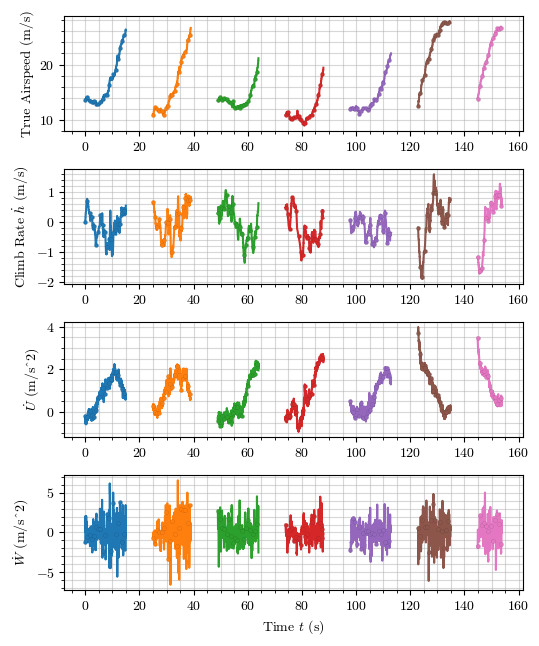

In [102]:
# Plotting Masked Acceleration Run Variables
markerstyle = 'o'
markerevery = 80
markedgew = 0.05
plt.figure(figsize=(5.5,6.5))
ax1 = plt.subplot(4,1,1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax1.plot(time_s, v_tas[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax1.set_ylabel("True Airspeed (m/s)")

ax0 = plt.subplot(4,1,2, sharex=ax1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax0.plot(time_s, Vd_tas[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax0.set_ylabel("Climb Rate $\dot{h}$ (m/s)")

ax2 = plt.subplot(4,1,3, sharex=ax1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax2.plot(time_s, U_dot[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax2.set_ylabel("$\dot{U}$ (m/s^2)")

ax3 = plt.subplot(4,1,4, sharex=ax1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax3.plot(time_s, W_dot[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax3.set_ylabel("$\dot{W}$ (m/s^2)")
ax3.set_xlabel("Time $t$ (s)")
plt.show()

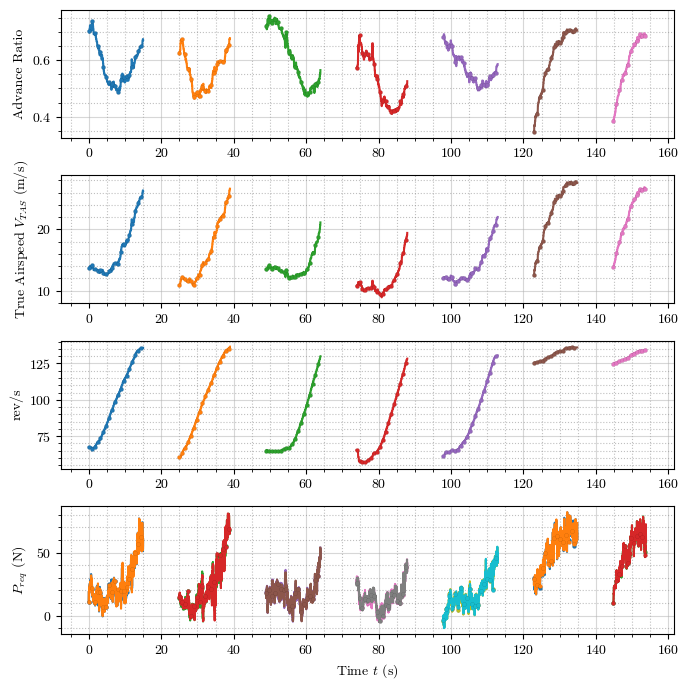

In [103]:
# Plotting Acceleration Runs
markerstyle = 'o'
markerevery = 80
markedgew = 0.05
plt.figure(figsize=(7,7))
ax1 = plt.subplot(4,1,1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax1.plot(time_s, J[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax1.set_ylabel("Advance Ratio")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')

ax0 = plt.subplot(4,1,2, sharex=ax1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax0.plot(time_s, v_tas[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax0.set_ylabel("True Airspeed $V_{TAS}$ (m/s)")
ax0.grid(which='major', linestyle='-')
ax0.grid(which='minor', linestyle=':', color='grey')

ax2 = plt.subplot(4,1,3, sharex=ax1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax2.plot(time_s, n[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax2.set_ylabel("rev/s")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')

ax3 = plt.subplot(4,1,4, sharex=ax1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax3.plot(time_s, P_req[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    ax3.plot(time_s, P_req_r2[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, label='Angle of Attack Rotated')
    t_init = time_s[-1]+10
#ax3.legend()
ax3.set_ylabel("$P_{req}$ (N)")
ax3.set_xlabel("Time $t$ (s)")
ax3.grid(which='major', linestyle='-')
ax3.grid(which='minor', linestyle=':', color='grey')

plt.show()

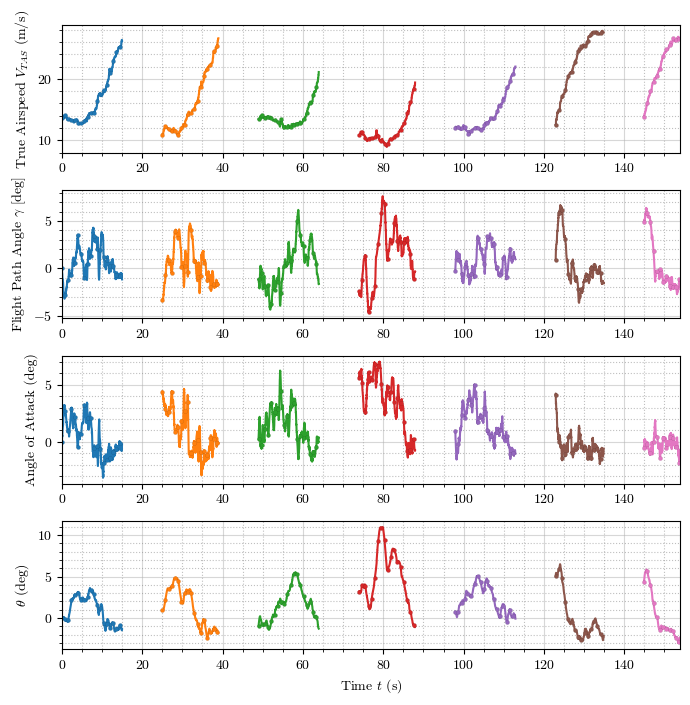

In [105]:
# Plotting Angle of Attack Parameters
markerstyle = 'o'
markerevery = 80
markedgew = 0.05
plt.figure(figsize=(7,7))
ax1 = plt.subplot(4,1,1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax1.plot(time_s, v_tas[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax1.set_ylabel("True Airspeed $V_{TAS}$ (m/s)")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.autoscale(enable=True, axis='x', tight=True)

ax0 = plt.subplot(4,1,2, sharex=ax1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax0.plot(time_s, np.rad2deg(gamma[mask_array[i]]), marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax0.set_ylabel("Flight Path Angle $\gamma$ [deg]")
ax0.grid(which='major', linestyle='-')
ax0.grid(which='minor', linestyle=':', color='grey')
ax0.autoscale(enable=True, axis='x', tight=True)

ax2 = plt.subplot(4,1,3, sharex=ax1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax2.plot(time_s, np.rad2deg(alpha[mask_array[i]]), marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax2.set_ylabel("Angle of Attack (deg)")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')
ax2.autoscale(enable=True, axis='x', tight=True)

ax3 = plt.subplot(4,1,4, sharex=ax1)
t_init = 0
for i in range(len(mask_array)):
    time_s = np.linspace(t_init, (len(v_tas[mask_array[i]])-1)/100 + t_init, len(v_tas[mask_array[i]]))
    ax3.plot(time_s, np.rad2deg(theta[mask_array[i]]), marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax3.set_ylabel("$\\theta$ (deg)")
ax3.set_xlabel("Time $t$ (s)")
ax3.grid(which='major', linestyle='-')
ax3.grid(which='minor', linestyle=':', color='grey')
ax3.autoscale(enable=True, axis='x', tight=True)

plt.tight_layout()
plt.show()

In [106]:
# Importing XFLR5 Results

xlfr_results = pd.read_csv('../Results/XFLR5_Linus_PowervsTAS.csv', delimiter=',')
V_xflr = xlfr_results[xlfr_results.columns[0]]
P_xflr = xlfr_results[xlfr_results.columns[1]]

In [107]:
# Importing Drag-Build Ups

linus_laminarbuild = pd.read_pickle("../../DragBuilds/Linus_DragBuildLaminar.pkl")
linus_turbulentbuild = pd.read_pickle("../../DragBuilds/Linus_DragBuildTurbulent.pkl")

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_11250/2850726705.py:25: RuntimeWarning:

Mean of empty slice.

/Users/williamkemp/opt/anaconda3/envs/superwake-records/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_11250/2850726705.py:26: RuntimeWarning:

Mean of empty slice.



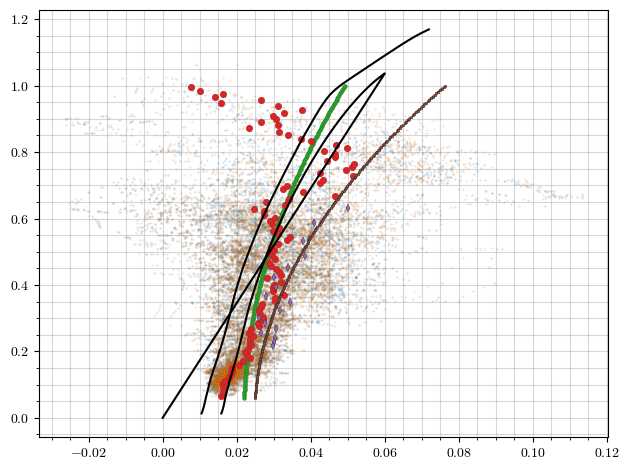

Polar Steady:  
[0.02477653 0.36179696]
Polar Accelerated: 
[0.02193859 0.68366465 0.        ]


In [108]:
# Getting Drag and Lift Coefficients for the correct moments in the flight


# Importing the results from Steady Level flight

full_result_steady = pd.read_pickle("../Results/2023-05-26_LinusSteadyLevel/acceleration_binresult.pkl")

cl_total = np.array([])
cd_total = np.array([])
cdaoa_total = np.array([])
for i in range(len(mask_array)):
    cl_total = np.append(cl_total, CL[mask_array[i]])
    cd_total = np.append(cd_total, CD[mask_array[i]])
    cdaoa_total = np.append(cdaoa_total, CD_r2[mask_array[i]])

savemat('../Results/cl_total.mat', {'cl_total': cl_total})
savemat('../Results/cd_total.mat', {'cd_total': cd_total})
polar_acceleration = cl_finders.cd2polar(linus, cdaoa_total, cl_total, highorder=True)
polar_acceleration_lo = cl_finders.cd2polar(linus, cdaoa_total, cl_total, highorder=False)

CL_fitted, CD_fitted = cl_finders.plotfittedpolar(linus, polar_acceleration_lo, np.array([0.06, 1.0]))

bins = np.linspace(0.05, 1.0,100)
digitized = np.digitize(cl_total, bins)
cl_means = [cl_total[digitized == i].mean() for i in range(1, len(bins))]
cd_means = [cdaoa_total[digitized == i].mean() for i in range(1, len(bins))]

plt.figure()
plt.plot(cd_total, cl_total, marker='.', markeredgecolor=[0,0,0], markersize=3, markeredgewidth=markedgew, linestyle='', alpha=0.2)
plt.plot(cdaoa_total, cl_total, marker='.', markeredgecolor=[0,0,0], markersize=3, markeredgewidth=markedgew, linestyle='', alpha=0.2)
plt.plot(CD_fitted, CL_fitted, marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markeredgewidth=markedgew, linestyle='-')
plt.plot(cd_means, cl_means, marker=markerstyle, markeredgecolor=[0,0,0], markersize=5, markeredgewidth=markedgew, linestyle='')

plt.plot(linus_laminarbuild.CD, linus_laminarbuild.CL, marker='', color='black')
plt.plot(linus_turbulentbuild.CD, linus_turbulentbuild.CL, marker='', color='black')

plt.plot(full_result_steady.ave_polar.CD, full_result_steady.ave_polar.CL, linestyle='', marker='d', markersize=4)
CL_fitted_steady, CD_fitted_steady = cl_finders.plotfittedpolar(linus, full_result_steady.fit_polar, np.array([0.06, 1.0]))
plt.plot(CD_fitted_steady, CL_fitted_steady, linestyle='--')

plt.show()

print("Polar Steady:  ")
print(full_result_steady.fit_polar)
print("Polar Accelerated: ")
print(polar_acceleration)
P_acc, EAS = cl_finders.polar2preqew(linus, polar_acceleration, (9,28), createvstandardweight=False)

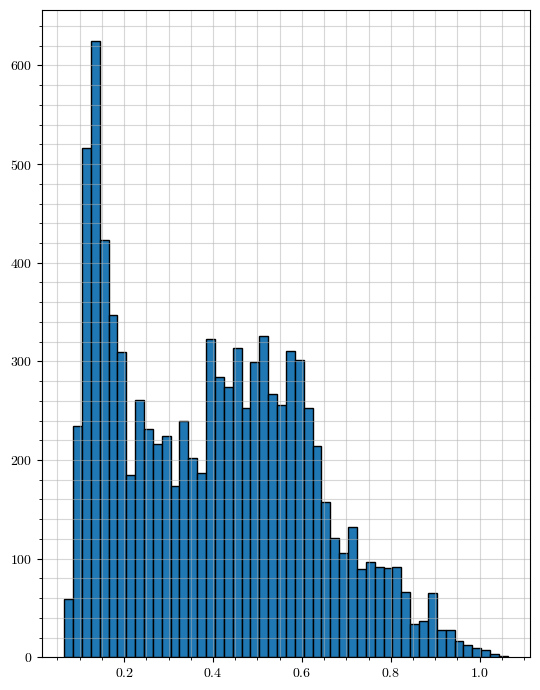

In [92]:
fig = plt.figure(figsize=(5.5,7))
plt.hist(cl_total, bins=50, edgecolor='k')
plt.show()

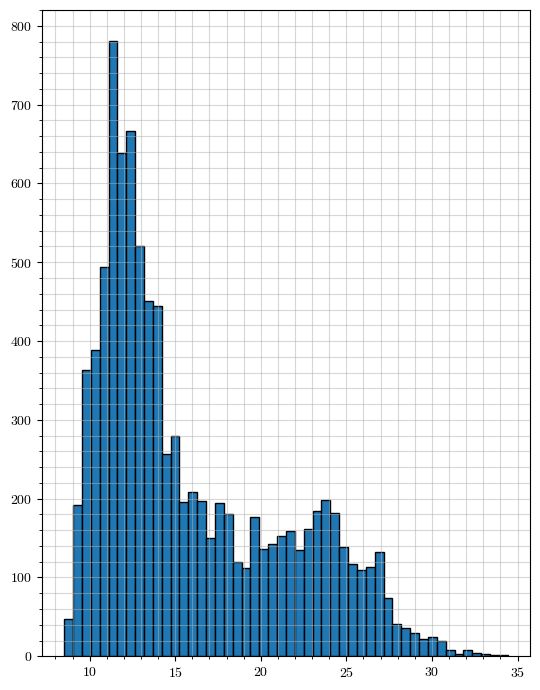

In [130]:
fig = plt.figure(figsize=(5.5,7))
plt.hist(np.sqrt((2*linus.weight)/(cl_total *linus.area*1.225)), bins=50, edgecolor='k')
plt.show()

In [93]:
def polarcurve_fit(CL_sq, cd0, k):
    # of the form CD = CD0 + kCL^2
    return cd0 + k * CL_sq

popt, pcov = optimize.curve_fit(polarcurve_fit, cl_total**2, cd_total, p0=[0, 0.1], maxfev=50000)
CD0 = popt[0]
K = popt[1]
e = (np.pi * linus.AR * K)**-1
print(popt)
print(e)

[0.02080555 0.01472475]
1.2681034813030672


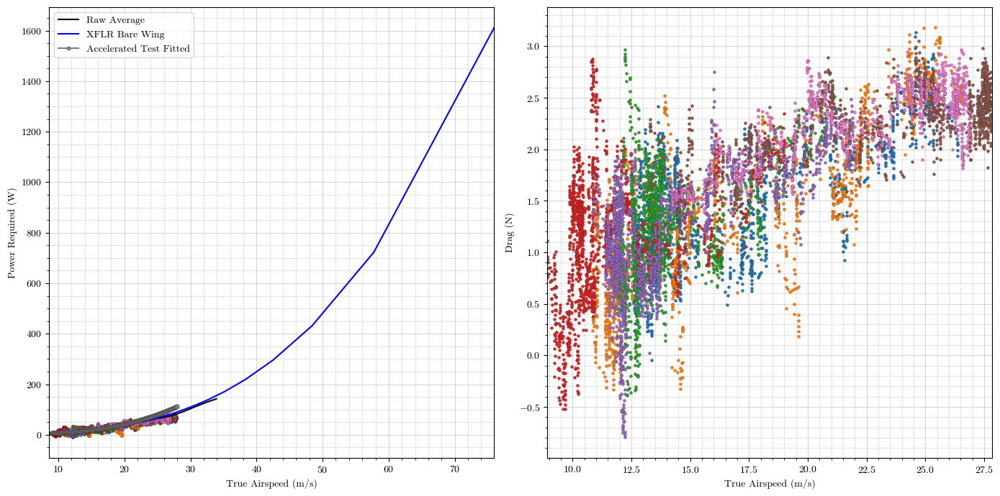

In [127]:
# Overplotting the results of the 6 Accelerations #
[P_acc_raw, EAS_acc] = cl_finders.rawpolar2preqew(linus, np.array(cl_means[1:]), np.array(cd_means[1:]))
[P_bu, EAS_bu] = cl_finders.rawpolar2preqew(linus, linus_turbulentbuild.CL, linus_turbulentbuild.CD)

markerstyle = 'o'
markerevery = 1
markedgew = 0.1
plt.figure(figsize=(14,7))
ax1 = plt.subplot(1,2,1)
for i in range(len(mask_array)):
    ax1.plot(v_tas[mask_array[i]], P_req_r2[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax1.plot(EAS_acc, P_acc_raw, color='black', marker='', label="Raw Average")
ax1.plot(EAS_bu, P_bu, marker='', color='blue', markeredgecolor=[0,0,0], markersize=4, markevery=markerevery, markeredgewidth=markedgew, linestyle='-', label='XFLR Bare Wing')
ax1.plot(EAS, P_acc, marker=markerstyle, markeredgecolor=[0,0,0], markersize=4, markevery=markerevery, markeredgewidth=markedgew, linestyle='-', label='Accelerated Test Fitted')
ax1.set_ylabel("Power Required (W)")
ax1.set_xlabel("True Airspeed (m/s)")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.legend()
ax1.autoscale(enable=True, axis='x', tight=True)

ax2 = plt.subplot(1,2,2)
for i in range(len(mask_array)):
    ax2.plot(v_tas[mask_array[i]], D[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax2.set_ylabel("Drag (N)")
ax2.set_xlabel("True Airspeed (m/s)")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')
ax2.autoscale(enable=True, axis='x', tight=True)
plt.tight_layout()
plt.show()

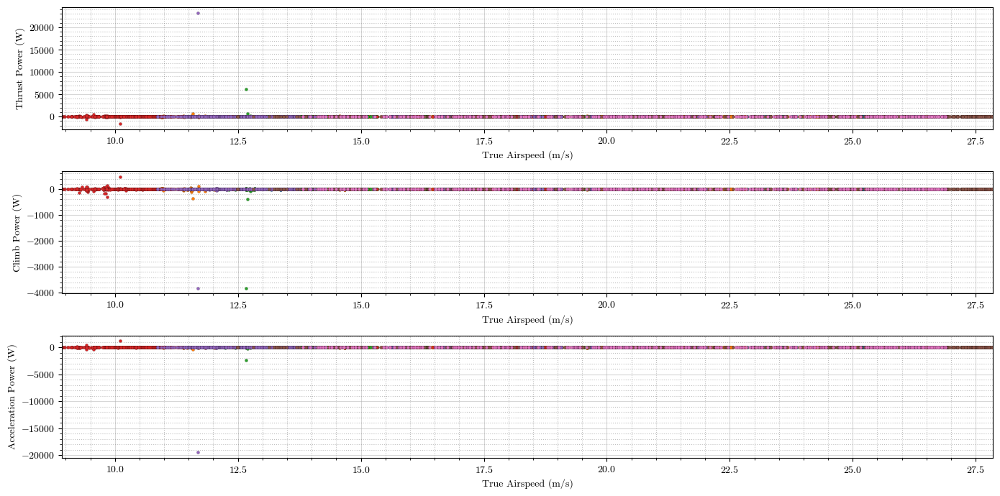

In [95]:
# Plotting all terms of power required to see significance

markerstyle = 'o'
markerevery = 1
markedgew = 0.1
plt.figure(figsize=(14,7))
ax1 = plt.subplot(3,1,1)
for i in range(len(mask_array)):
    ax1.plot(v_tas[mask_array[i]], P_req_t1[mask_array[i]]/P_req[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax1.set_ylabel("Thrust Power (W)")
ax1.set_xlabel("True Airspeed (m/s)")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.autoscale(enable=True, axis='x', tight=True)

ax2 = plt.subplot(3,1,2,sharex=ax1)
for i in range(len(mask_array)):
    ax2.plot(v_tas[mask_array[i]], P_req_t2[mask_array[i]]/P_req[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax2.set_ylabel("Climb Power (W)")
ax2.set_xlabel("True Airspeed (m/s)")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')
ax2.autoscale(enable=True, axis='x', tight=True)

ax3 = plt.subplot(3,1,3, sharex=ax1)
for i in range(len(mask_array)):
    ax3.plot(v_tas[mask_array[i]], P_req_t3[mask_array[i]]/P_req[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax3.set_ylabel("Acceleration Power (W)")
ax3.set_xlabel("True Airspeed (m/s)")
ax3.grid(which='major', linestyle='-')
ax3.grid(which='minor', linestyle=':', color='grey')
ax3.autoscale(enable=True, axis='x', tight=True)

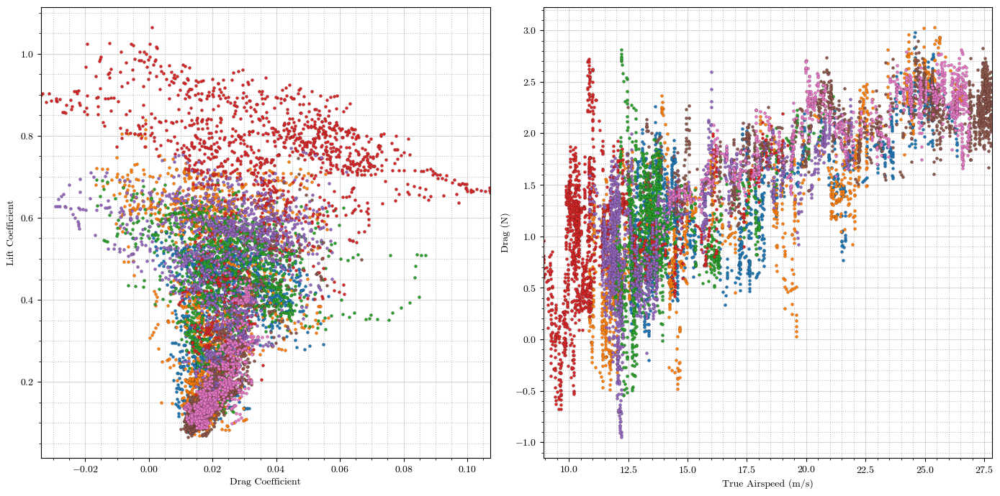

In [96]:
# Plotting the drag polar of the Vehicle

markerstyle = 'o'
markerevery = 1
markedgew = 0.1
plt.figure(figsize=(14,7))
ax1 = plt.subplot(1,2,1)
for i in range(len(mask_array)):
    ax1.plot(CD[mask_array[i]], CL[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax1.set_ylabel("Lift Coefficient")
ax1.set_xlabel("Drag Coefficient")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.autoscale(enable=True, axis='x', tight=True)

ax2 = plt.subplot(1,2,2)
for i in range(len(mask_array)):
    ax2.plot(v_tas[mask_array[i]], D[mask_array[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax2.set_ylabel("Drag (N)")
ax2.set_xlabel("True Airspeed (m/s)")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')
ax2.autoscale(enable=True, axis='x', tight=True)
plt.tight_layout()
plt.show()

Develop a weighting system for the curve fitting, by finding the standard deviation in each CL bin, then using this normalized as an input to the curve fit!